# Gaussian Mixture Model (GMM) Sampling

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

os.chdir('../')

import tgmm
import importlib
importlib.reload(tgmm)

from tgmm import GaussianMixture, GMMInitializer, dynamic_figsize, plot_gmm

device = 'cuda' if torch.cuda.is_available() else 'cpu'
random_state = 0
np.random.seed(random_state)
torch.manual_seed(random_state)

if device == 'cuda':
    torch.cuda.manual_seed(random_state)
    print('CUDA version:', torch.version.cuda)
    print('Device:', torch.cuda.get_device_name(0))
else:
    print('Using CPU')

Using CPU


## Synthetic Data Generation

The synthetic dataset is generated by combining four Gaussian components:

- **Component 1:** Centered at `[0, 2]` with spherical covariance.
- **Component 2:** Centered at `[2, -2]` with spherical covariance (fewer points).
- **Component 3:** Centered at `[0, 0]` with diagonal covariance.
- **Component 4:** Centered at `[2, 2]` with full covariance.

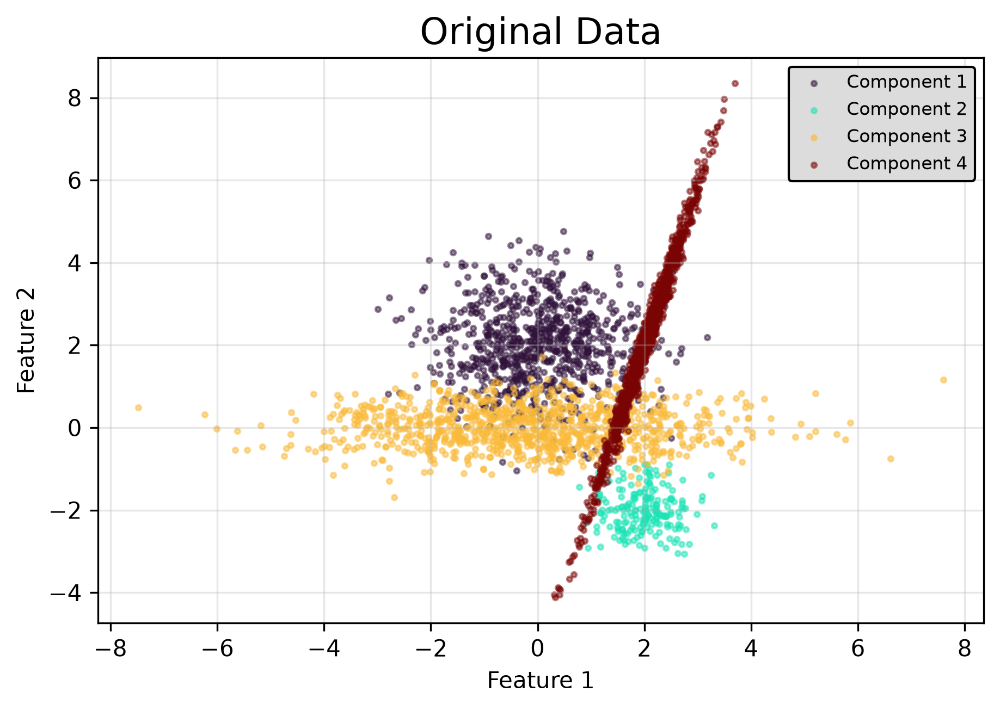

In [2]:
n_samples = [800, 200, 1000, 1000]
centers = [np.array([0, 2]),
           np.array([2, -2]),
           np.array([0, 0]),
           np.array([2, 2])]
covs = [
    1.0 * np.eye(2),                    # spherical covariance
    0.5 * np.eye(2),                    # spherical covariance, fewer points
    np.array([[2, 0], [0, 0.5]]),       # diagonal covariance
    np.array([[0.2, 0.5], [0.5, 2]])    # full covariance
]

components = []
for n, center, cov in zip(n_samples, centers, covs):
    samples = np.dot(np.random.randn(n, 2), cov) + center
    components.append(samples)

X = np.vstack(components)
labels = np.concatenate([i * np.ones(n) for i, n in enumerate(n_samples)])
legend_labels = [f'Component {i+1}' for i in range(len(n_samples))]

n_features = X.shape[1]
n_components = len(n_samples)

plot_gmm(X=X, true_labels=labels, title='Original Data', legend_labels=legend_labels)
plt.show()

## Fitting the Gaussian Mixture Model

This section sets up the GMM with the following parameters:

- **n_components:** Number of clusters (set to 4).
- **covariance_type:** Using the 'full' covariance model.
- **Tolerance, regularization, and maximum iterations:** Set for a precise convergence.
- **Initialization:** Using random initialization with multiple random restarts (`n_init=5`).

The GMM is then fitted to the data via the EM algorithm. After fitting, we obtain:

- **Predicted Cluster Labels:** Using the `predict` method.
- **Per-Sample Log-Likelihoods:** Using the `score_samples` method.
- **Posterior Probabilities:** For each data sample across all components.
- **New Samples:** Generated from the fitted GMM, along with the corresponding component indices.

Diagnostic information such as mean log-likelihood, convergence status, and number of iterations is printed to verify the model's performance.

In [3]:
# Convert to tensor (if needed for further processing)
X_tensor = torch.tensor(X, dtype=torch.float32, device=device)

n_components = 4

# Initialize the GMM
gmm = GaussianMixture(
    n_components=n_components,
    covariance_type='full',
    tol=1e-6,
    reg_covar=1e-10,
    max_iter=1000,
    init_means='random',
    init_covariances='eye',
    n_init = 5,
    random_state=None,
    warm_start=False,
    verbose=False,
    verbose_interval=10,
    device='cpu',
)
# Fit the GMM
gmm.fit(X_tensor)

# Get predictions
y_pred = gmm.predict(X_tensor)

# Compute per-sample log-likelihoods
log_probs = gmm.score_samples(X_tensor)

# Get probabilities for each sample for each component
probs = gmm.predict_proba(X_tensor)
probs = probs.detach()

# Generate new samples
n_samples_to_generate = len(X)
gmm_samples, gmm_labels = gmm.sample(n_samples_to_generate)
gmm_samples = gmm_samples.detach().cpu().numpy()
gmm_labels = gmm_labels.detach().cpu().numpy()

# Compute probabilities for each generated sample
generated_probs = gmm.predict_proba(torch.tensor(gmm_samples, dtype=torch.float32).to(device))
generated_probs = generated_probs.detach().cpu().numpy()

print('Mean per-sample log-likelihood:                        ', gmm.score(X_tensor))
print('Mean per-sample log-likelihood (torch.mean(log_probs)):', torch.mean(log_probs).item())
print('Lower bound:                                           ', gmm.lower_bound_)
for i in range(probs.shape[0]):
    assert np.isclose(torch.sum(probs[i]).item(), 1.0), f"Probabilities for sample {i} do not sum to 1"
print('Number of iterations:                                  ', gmm.n_iter_)
print('Converged:                                             ', gmm.converged_)


Mean per-sample log-likelihood:                         -3.159071207046509
Mean per-sample log-likelihood (torch.mean(log_probs)): -3.159071207046509
Lower bound:                                            -3.159071207046509
Number of iterations:                                   57
Converged:                                              True


## Sampling from Specific Components

This section demonstrates the new functionality for sampling from specific GMM components. The `sample` method now accepts a `component` parameter:

- **`component=None` (default):** Samples from all components according to their mixture weights
- **`component=k`:** Samples only from component k (where k ∈ {0, 1, ..., n_components-1})

This allows us to generate samples that are guaranteed to come from a specific component, which is useful for:
- Understanding the individual component distributions
- Generating synthetic data with known ground truth labels
- Analyzing the learned parameters of each component separately

Below, we demonstrate sampling from each component individually and compare with mixed sampling.

Component 0: Generated 500 samples, all from component 0
  Unique labels in output: [0]
  Component weight: 0.065

Component 1: Generated 500 samples, all from component 1
  Unique labels in output: [1]
  Component weight: 0.268

Component 2: Generated 500 samples, all from component 2
  Unique labels in output: [2]
  Component weight: 0.336

Component 3: Generated 500 samples, all from component 3
  Unique labels in output: [3]
  Component weight: 0.331

Mixed sampling: Generated 2000 samples from all components
  Label distribution: [130 515 650 705]
  Expected distribution based on weights: [129 536 671 662]


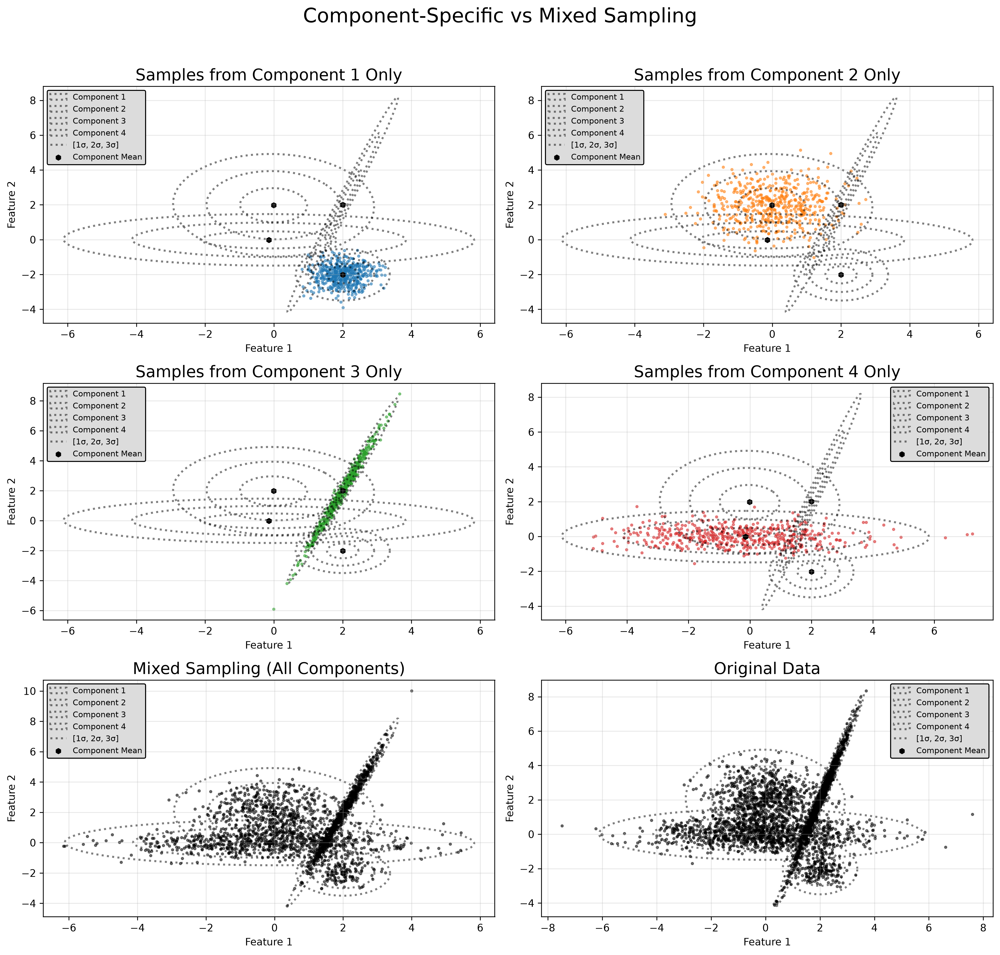

In [4]:
# Generate samples from each component individually
n_samples_per_component = 500

# Sample from each component separately
component_samples = {}
component_labels = {}

for k in range(gmm.n_components):
    samples, labels = gmm.sample(n_samples_per_component, component=k)
    component_samples[k] = samples.detach().cpu().numpy()
    component_labels[k] = labels.detach().cpu().numpy()
    print(f"Component {k}: Generated {len(samples)} samples, all from component {k}")
    print(f"  Unique labels in output: {np.unique(labels.cpu().numpy())}")
    print(f"  Component weight: {gmm.weights_[k].item():.3f}")
    print()

# Sample from all components (mixed sampling) for comparison
mixed_samples, mixed_labels = gmm.sample(n_samples_per_component * gmm.n_components, component=None)
mixed_samples = mixed_samples.detach().cpu().numpy()
mixed_labels = mixed_labels.detach().cpu().numpy()

print(f"Mixed sampling: Generated {len(mixed_samples)} samples from all components")
print(f"  Label distribution: {np.bincount(mixed_labels)}")
print(f"  Expected distribution based on weights: {(gmm.weights_.cpu().numpy() * len(mixed_samples)).astype(int)}")

# Visualize samples from each component
nrows, ncols = 3, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axs = plt.subplots(nrows, ncols, figsize=figsize)
axs = axs.flatten()
colors = ['C0', 'C1', 'C2', 'C3']

# Plot individual component samples
for k in range(gmm.n_components):
    ax = axs[k]
    plot_gmm(X=component_samples[k], gmm=gmm, ax=ax, 
             title=f'Samples from Component {k+1} Only',
             legend_labels=[f'Component {k+1}'],
             ellipse_fill=False,
             color_by_cluster=True,
             point_color=colors[k])

# Plot mixed sampling
ax = axs[4]
plot_gmm(X=mixed_samples, gmm=gmm, ax=ax, 
         title='Mixed Sampling (All Components)',
         legend_labels=[f'Component {i+1}' for i in range(gmm.n_components)],
         ellipse_fill=False)

# Plot original data for comparison
ax = axs[5]
plot_gmm(X=X, gmm=gmm, ax=ax, 
         title='Original Data',
         legend_labels=legend_labels,
         ellipse_fill=False)

plt.suptitle("Component-Specific vs Mixed Sampling")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## Sampling with Standard Deviation Radius

This section demonstrates a new sampling functionality that allows sampling within a specified standard deviation radius from component means. This is useful for evaluating model quality by examining samples at different confidence levels.

The `sample` method now accepts a `std_radius` parameter:
- When `std_radius=None` (default): Sample from the entire Gaussian distribution
- When `std_radius=float`: Only return samples within this many standard deviations from the component mean

This uses rejection sampling to ensure all returned samples are within the specified radius, measured using the Mahalanobis distance. This functionality is particularly valuable for:
- **Quality assessment**: Examining how samples behave at different confidence levels
- **Controlled generation**: Creating samples with known proximity to component centers
- **Outlier analysis**: Understanding the distribution of samples at various standard deviation thresholds

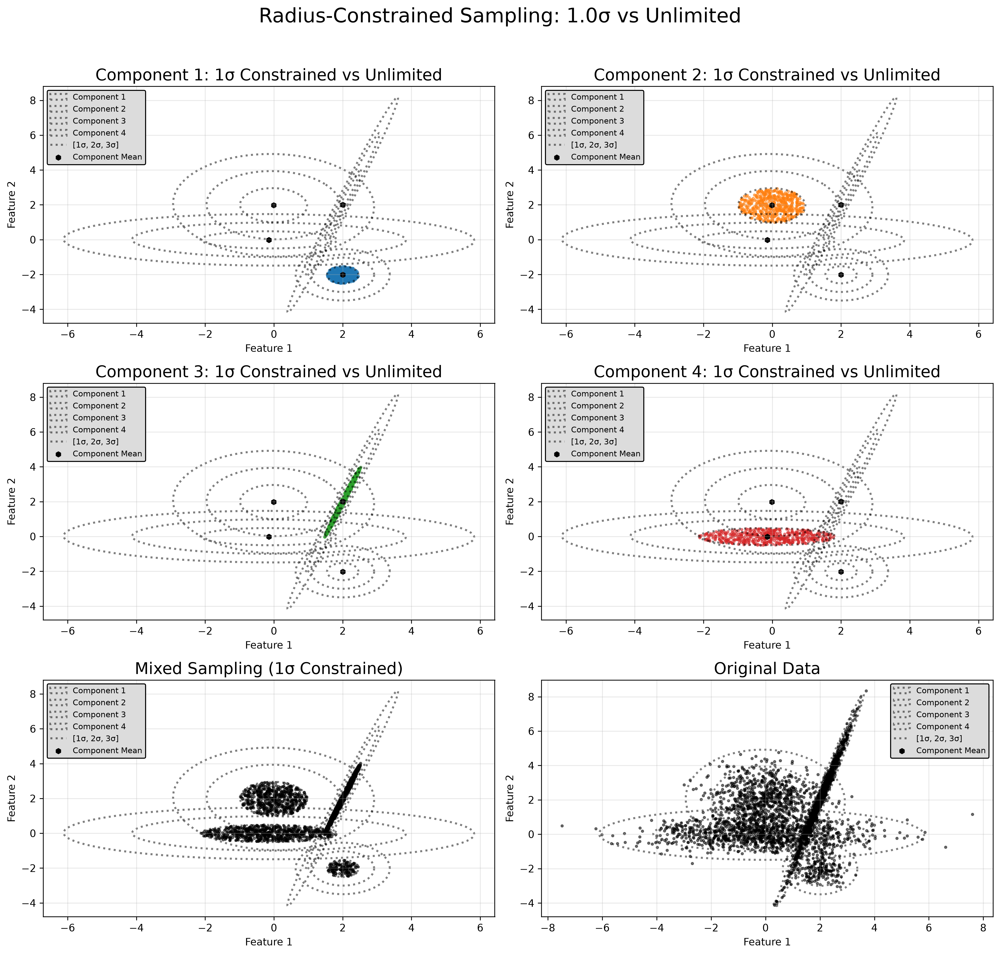

In [5]:
n_samples_per_component = 500
std_radius = 1.0  # Sample within 1 standard deviation

# Sample from each component separately with radius constraint
component_samples_constrained = {}
component_labels_constrained = {}

# Sample from each component separately without radius constraint (for comparison)
component_samples_unlimited = {}
component_labels_unlimited = {}

for k in range(gmm.n_components):
    # Constrained sampling
    samples_constrained, labels_constrained = gmm.sample(n_samples_per_component, component=k, std_radius=std_radius)
    component_samples_constrained[k] = samples_constrained.detach().cpu().numpy()
    component_labels_constrained[k] = labels_constrained.detach().cpu().numpy()
    
    # Unlimited sampling
    samples_unlimited, labels_unlimited = gmm.sample(n_samples_per_component, component=k)
    component_samples_unlimited[k] = samples_unlimited.detach().cpu().numpy()
    component_labels_unlimited[k] = labels_unlimited.detach().cpu().numpy()


mixed_samples_constrained, mixed_labels_constrained = gmm.sample(n_samples_per_component * gmm.n_components, component=None, std_radius=std_radius)
mixed_samples_unlimited, mixed_labels_unlimited = gmm.sample(n_samples_per_component * gmm.n_components, component=None)

mixed_samples_constrained = mixed_samples_constrained.detach().cpu().numpy()
mixed_labels_constrained = mixed_labels_constrained.detach().cpu().numpy()
mixed_samples_unlimited = mixed_samples_unlimited.detach().cpu().numpy()
mixed_labels_unlimited = mixed_labels_unlimited.detach().cpu().numpy()

# Visualize samples: constrained vs unlimited
nrows, ncols = 3, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axs = plt.subplots(nrows, ncols, figsize=figsize)
axs = axs.flatten()
colors = ['C0', 'C1', 'C2', 'C3']

# Plot individual component samples (constrained)
for k in range(gmm.n_components):
    ax = axs[k]
    
    # Plot unlimited samples in light color
    plot_gmm(X=component_samples_constrained[k], gmm=gmm, ax=ax, 
             title=f'Component {k+1}: 1σ Constrained vs Unlimited',
             legend_labels=[f'Component {k+1} Unlimited', f'Component {k+1} (1σ)'],
             ellipse_fill=False,
             color_by_cluster=False,
             point_color=colors[k]
             )

# Plot mixed sampling comparison (constrained)
ax = axs[4]
plot_gmm(X=mixed_samples_constrained, gmm=gmm, ax=ax, 
         title=f'Mixed Sampling (1σ Constrained)',
         legend_labels=[f'Component {i+1}' for i in range(gmm.n_components)],
         ellipse_fill=False)

# Plot original data for comparison
ax = axs[5]
plot_gmm(X=X, gmm=gmm, ax=ax, 
         title='Original Data',
         legend_labels=legend_labels,
         ellipse_fill=False)

plt.suptitle(f"Radius-Constrained Sampling: {std_radius}σ vs Unlimited")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

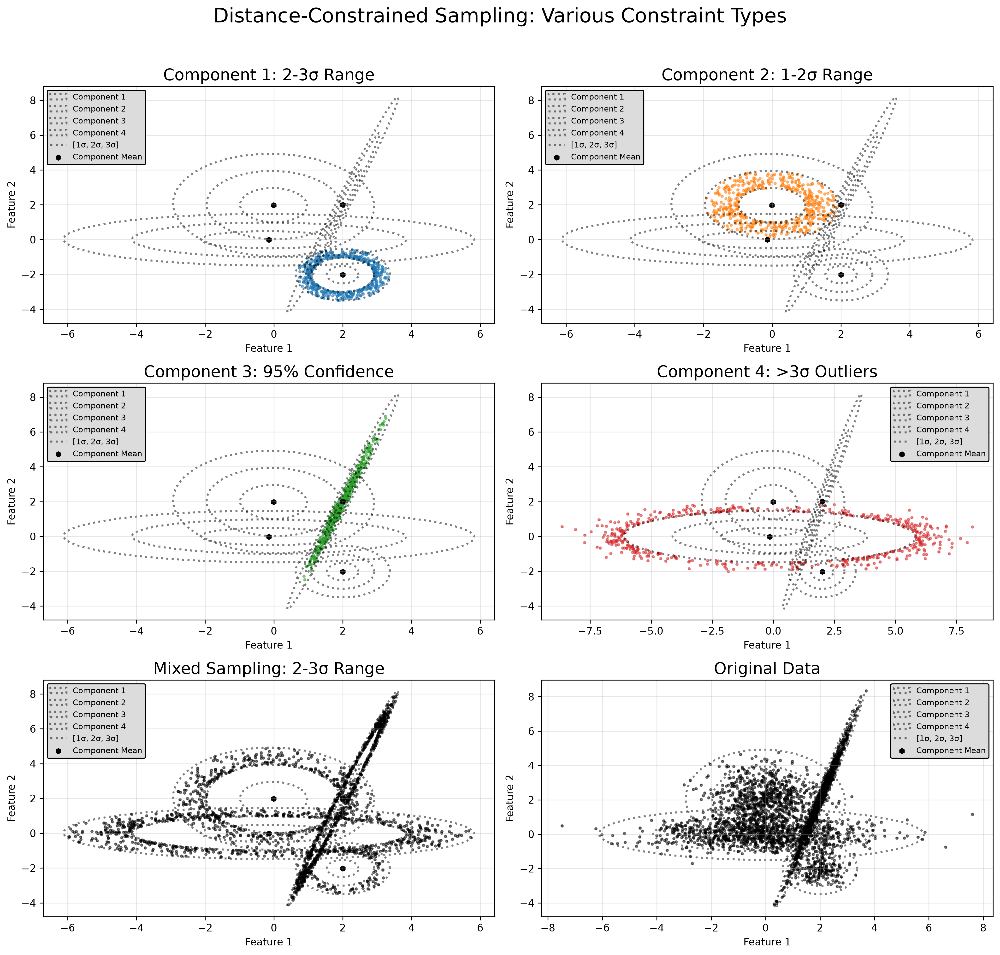

In [6]:
n_samples_per_component = 500
# Remove unused std_radius variable since you're using different constraints

# Sample from each component separately with different constraints
component_samples_constrained = {}
component_labels_constrained = {}

samples_constrained, labels_constrained = gmm.sample(n_samples_per_component, component=0, std_range=[2,3])
component_samples_constrained[0] = samples_constrained.detach().cpu().numpy()
component_labels_constrained[0] = labels_constrained.detach().cpu().numpy()

samples_constrained, labels_constrained = gmm.sample(n_samples_per_component, component=1, std_range=[1,2])
component_samples_constrained[1] = samples_constrained.detach().cpu().numpy()
component_labels_constrained[1] = labels_constrained.detach().cpu().numpy()

samples_constrained, labels_constrained = gmm.sample(n_samples_per_component, component=2, confidence=0.95)
component_samples_constrained[2] = samples_constrained.detach().cpu().numpy()
component_labels_constrained[2] = labels_constrained.detach().cpu().numpy()

samples_constrained, labels_constrained = gmm.sample(n_samples_per_component, component=3, std_range=[3,float('inf')], max_attempts_per_sample=5000)
component_samples_constrained[3] = samples_constrained.detach().cpu().numpy()
component_labels_constrained[3] = labels_constrained.detach().cpu().numpy()

mixed_samples_constrained, mixed_labels_constrained = gmm.sample(n_samples_per_component * gmm.n_components, component=None, std_range=[2,3])
mixed_samples_unlimited, mixed_labels_unlimited = gmm.sample(n_samples_per_component * gmm.n_components, component=None)

mixed_samples_constrained = mixed_samples_constrained.detach().cpu().numpy()
mixed_labels_constrained = mixed_labels_constrained.detach().cpu().numpy()
mixed_samples_unlimited = mixed_samples_unlimited.detach().cpu().numpy()
mixed_labels_unlimited = mixed_labels_unlimited.detach().cpu().numpy()

# Visualize samples: constrained vs unlimited
nrows, ncols = 3, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axs = plt.subplots(nrows, ncols, figsize=figsize)
axs = axs.flatten()
colors = ['C0', 'C1', 'C2', 'C3']

# Plot individual component samples (constrained)
constraint_titles = [
    'Component 1: 2-3σ Range',
    'Component 2: 1-2σ Range', 
    'Component 3: 95% Confidence',
    'Component 4: >3σ Outliers'
]

for k in range(len(component_samples_constrained)):
    ax = axs[k]
    
    # Plot constrained samples
    plot_gmm(X=component_samples_constrained[k], gmm=gmm, ax=ax, 
             title=constraint_titles[k],
             legend_labels=[f'Component {k+1} Constrained'],
             ellipse_fill=False,
             color_by_cluster=False,
             point_color=colors[k]
             )

# Plot mixed sampling comparison (constrained)
ax = axs[4]
plot_gmm(X=mixed_samples_constrained, gmm=gmm, ax=ax, 
         title='Mixed Sampling: 2-3σ Range',
         legend_labels=[f'Component {i+1}' for i in range(gmm.n_components)],
         ellipse_fill=False)

# Plot original data for comparison
ax = axs[5]
plot_gmm(X=X, gmm=gmm, ax=ax, 
         title='Original Data',
         legend_labels=legend_labels,
         ellipse_fill=False)

plt.suptitle("Distance-Constrained Sampling: Various Constraint Types")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

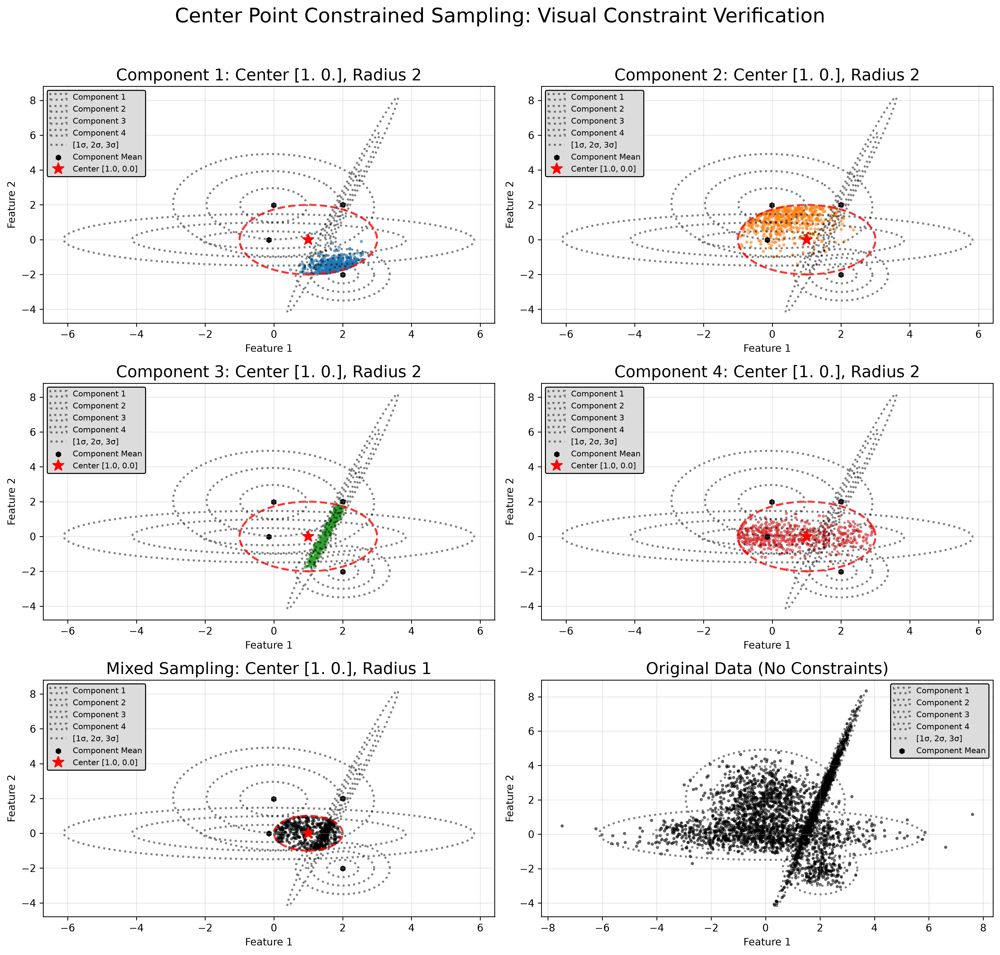

In [7]:
n_samples = 500

# Define the center point and radius for visualization
center_point = torch.tensor([1.0, 0.0])
center_radius = 2

# Sample from each component separately with different constraints
component_samples_constrained = {}
component_labels_constrained = {}

samples_constrained, labels_constrained = gmm.sample(n_samples, component=0, center_point=center_point, center_radius=center_radius, max_attempts_per_sample=10000)
component_samples_constrained[0] = samples_constrained.detach().cpu().numpy()
component_labels_constrained[0] = labels_constrained.detach().cpu().numpy()

samples_constrained, labels_constrained = gmm.sample(n_samples, component=1, center_point=center_point, center_radius=center_radius, max_attempts_per_sample=10000)
component_samples_constrained[1] = samples_constrained.detach().cpu().numpy()
component_labels_constrained[1] = labels_constrained.detach().cpu().numpy()

samples_constrained, labels_constrained = gmm.sample(n_samples, component=2, center_point=center_point, center_radius=center_radius, max_attempts_per_sample=10000)
component_samples_constrained[2] = samples_constrained.detach().cpu().numpy()
component_labels_constrained[2] = labels_constrained.detach().cpu().numpy()

samples_constrained, labels_constrained = gmm.sample(n_samples, component=3, center_point=center_point, center_radius=center_radius, max_attempts_per_sample=10000)
component_samples_constrained[3] = samples_constrained.detach().cpu().numpy()
component_labels_constrained[3] = labels_constrained.detach().cpu().numpy()

mixed_samples_constrained, mixed_labels_constrained = gmm.sample(n_samples, component=None, center_point=center_point, center_radius=1, max_attempts_per_sample=10000)
mixed_samples_unlimited, mixed_labels_unlimited = gmm.sample(n_samples, component=None)

mixed_samples_constrained = mixed_samples_constrained.detach().cpu().numpy()
mixed_labels_constrained = mixed_labels_constrained.detach().cpu().numpy()
mixed_samples_unlimited = mixed_samples_unlimited.detach().cpu().numpy()
mixed_labels_unlimited = mixed_labels_unlimited.detach().cpu().numpy()

# Convert center point to numpy for plotting
center_np = center_point.numpy()

# Visualize samples: constrained vs unlimited
nrows, ncols = 3, 2
figsize = dynamic_figsize(nrows, ncols)
fig, axs = plt.subplots(nrows, ncols, figsize=figsize)
axs = axs.flatten()
colors = ['C0', 'C1', 'C2', 'C3']

# Plot individual component samples (constrained)
constraint_titles = [
    f'Component 1: Center {center_np}, Radius {center_radius}',
    f'Component 2: Center {center_np}, Radius {center_radius}', 
    f'Component 3: Center {center_np}, Radius {center_radius}',
    f'Component 4: Center {center_np}, Radius {center_radius}'
]

for k in range(len(component_samples_constrained)):
    ax = axs[k]
    
    # Plot constrained samples
    plot_gmm(X=component_samples_constrained[k], gmm=gmm, ax=ax, 
             title=constraint_titles[k],
             legend_labels=[f'Component {k+1} Constrained'],
             ellipse_fill=False,
             color_by_cluster=False,
             point_color=colors[k],
             )
    
    # Add center point constraint visualization
    # Draw the constraint circle
    circle = plt.Circle(center_np, center_radius, fill=False, color='red', 
                       linewidth=2, linestyle='--', alpha=0.8)
    ax.add_patch(circle)
    
    # Mark the center point
    ax.plot(center_np[0], center_np[1], 'r*', markersize=12, 
           label=f'Center [{center_np[0]}, {center_np[1]}]')
    
    # Update legend to include constraint info
    ax.legend()

# Plot mixed sampling comparison (constrained)
ax = axs[4]
plot_gmm(X=mixed_samples_constrained, gmm=gmm, ax=ax, 
         title=f'Mixed Sampling: Center {center_np}, Radius {1}',
         legend_labels=[f'Component {i+1}' for i in range(gmm.n_components)],
         ellipse_fill=False)

# Add center point constraint visualization to mixed plot
circle_mixed = plt.Circle(center_np, 1, fill=False, color='red', 
                         linewidth=2, linestyle='--', alpha=0.8)
ax.add_patch(circle_mixed)
ax.plot(center_np[0], center_np[1], 'r*', markersize=12, 
       label=f'Center [{center_np[0]}, {center_np[1]}]')
ax.legend()

# Plot original data for comparison
ax = axs[5]
plot_gmm(X=X, gmm=gmm, ax=ax, 
         title='Original Data (No Constraints)',
         legend_labels=legend_labels,
         ellipse_fill=False)

ax.legend()

plt.suptitle("Center Point Constrained Sampling: Visual Constraint Verification")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## **Important**: The Curse of Dimensionality in GMM Sampling

**Why does `std_radius=1.0` fail in high-dimensional spaces?**

In high-dimensional spaces, the concept of "1 standard deviation" behaves very differently than in 1D or 2D:

### Mathematical Explanation
- **1D**:       ~68.27% of samples fall within 1 std deviation
- **2D**:       ~39.35% of samples fall within 1 std deviation
- **10D**:      ~0.02% of samples fall within 1 std deviation

For a $d$-dimensional standard multivariate Gaussian distribution $\mathbf{X} \sim \mathcal{N}(0, I)$, the squared distance from the origin follows a chi-square distribution:

$$
\|\mathbf{X}\|^2 = X_1^2 + X_2^2 + \cdots + X_d^2 \sim \chi^2(d)
$$

The probability that a sample lies within radius $r$ of the origin is:

$$
P(\|\mathbf{X}\| \leq r) = P(\chi^2(d) \leq r^2)
$$

#### **Table: Percentage of Samples Within $k$ Standard Deviations**

| Dimension | Within 1 std ($r=1$) | Within 2 std ($r=2$) | Radius for 95% ($r_{95}$) |
|-----------|----------------------|----------------------|--------------------------|
| 1         | 68.27%               | 95.45%               | $r \approx 1.96$         |
| 2         | 39.35%               | 86.47%               | $r \approx 2.45$         |
| 3         | 19.87%               | 70.75%               | $r \approx 2.80$         |
| 5         | 3.74%                | 36.97%               | $r \approx 3.36$         |
| 10        | 0.02%                | 4.55%                | $r \approx 4.36$         |




### How to Find the Ideal Radius for a Given Percentage

To find the radius $r$ that contains a desired percentage $p$ of samples from a $d$-dimensional standard Gaussian, you need to solve:

$$
P(\|\mathbf{X}\| \leq r) = p
$$

Since $ \|\mathbf{X}\|^2 \sim \chi^2(d) $, this is equivalent to:

$$
P(\chi^2(d) \leq r^2) = p
$$

So, $ r^2 $ is the $p$-th quantile of the chi-square distribution with $d$ degrees of freedom. Denote this quantile as $q_p$:

$$
r = \sqrt{q_p}
$$

where $q_p$ solves $F_{\chi^2(d)}(q_p) = p$, with $F_{\chi^2(d)}$ being the cumulative distribution function (CDF).

#### **Exact Formula:**

$$
r_p = \sqrt{F_{\chi^2(d)}^{-1}(p)}
$$

where $F_{\chi^2(d)}^{-1}$ is the inverse CDF (quantile function) of the chi-square distribution.

**Example:**

- For 95% of samples ($p=0.95$), the ideal radius is:

$$
r_{95} = \sqrt{F_{\chi^2(d)}^{-1}(0.95)}
$$

**In Python, you can compute this with:**

```python
from scipy.stats import chi2
d = 10  # for example
desired_p = 0.95
r_95 = (chi2.ppf(desired_p, d))**0.5
```